# Install the required packages

In [ ]:
!pip install -U pandas_profiling
!pip install -U xlrd
!pip install feature-engine
!pip install tune-sklearn ray[tune]

Cloning into 'MachineLearningBasic'...
remote: Enumerating objects: 36, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 36 (delta 7), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (36/36), 9.70 MiB | 4.48 MiB/s, done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 38.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 38.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=739cb23ba

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_extraction import FeatureHasher
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# Library for optimize training
from tune_sklearn import TuneGridSearchCV
from joblib import parallel_backend
from ray.util.joblib import register_ray

# Load dataset

In [ ]:
import os
os.chdir('{your_path}/data')

In [ ]:
pd.set_option("display.max_columns",None)
df = pd.read_csv('Banking.csv')
df.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate
0,10000001,"7,000",< 1 year,Rent,68000.0,not verified,car,18.37,0,NaN,9,14,Female,1
1,10000002,"30,000",4 years,Mortgage,NaN,VERIFIED - income,debt_consolidation,14.93,0,17.0,12,24,Female,3
2,10000003,"24,725",7 years,Mortgage,75566.4,VERIFIED - income source,debt_consolidation,15.88,0,NaN,12,16,Male,3
3,10000004,"16,000",< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,Male,3
4,10000005,"17,000",8 years,Own,96000.0,VERIFIED - income source,debt_consolidation,22.17,1,NaN,19,30,Female,1


# Data Analysis

In [ ]:
df.describe()

,Loan_ID,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
count,1.643090e+05,1.392070e+05,164309.000000,164309.000000,75930.000000,164309.000000,164309.000000,164309.000000
mean,1.008216e+07,7.333116e+04,17.207189,0.781698,34.229356,11.193818,25.067665,2.158951
std,4.743207e+04,6.037750e+04,7.845083,1.034747,21.761180,4.991813,11.583067,0.738364
min,1.000000e+07,4.000000e+03,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000
25%,1.004108e+07,4.500000e+04,11.370000,0.000000,16.000000,8.000000,17.000000,2.000000
50%,1.008216e+07,6.300000e+04,16.840000,0.000000,31.000000,10.000000,23.000000,2.000000
75%,1.012323e+07,8.869750e+04,22.780000,1.000000,50.000000,14.000000,32.000000,3.000000
max,1.016431e+07,7.500000e+06,39.990000,8.000000,180.000000,76.000000,156.000000,3.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164309 entries, 0 to 164308
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_ID                  164309 non-null  int64  
 1   Loan_Amount_Requested    164309 non-null  object 
 2   Length_Employed          156938 non-null  object 
 3   Home_Owner               138960 non-null  object 
 4   Annual_Income            139207 non-null  float64
 5   Income_Verified          164309 non-null  object 
 6   Purpose_Of_Loan          164309 non-null  object 
 7   Debt_To_Income           164309 non-null  float64
 8   Inquiries_Last_6Mo       164309 non-null  int64  
 9   Months_Since_Deliquency  75930 non-null   float64
 10  Number_Open_Accounts     164309 non-null  int64  
 11  Total_Accounts           164309 non-null  int64  
 12  Gender                   164309 non-null  object 
 13  Interest_Rate            164309 non-null  int64  
dtypes: f

Check missing values or Nan values

In [ ]:
df.isna().sum()

Loan_ID                        0
Loan_Amount_Requested          0
Length_Employed             7371
Home_Owner                 25349
Annual_Income              25102
Income_Verified                0
Purpose_Of_Loan                0
Debt_To_Income                 0
Inquiries_Last_6Mo             0
Months_Since_Deliquency    88379
Number_Open_Accounts           0
Total_Accounts                 0
Gender                         0
Interest_Rate                  0
dtype: int64

In [ ]:
for cat in df.select_dtypes('object') :
  print(f"Columns: {cat} has {len(df[cat].unique())} distinct value:\n {df[cat].value_counts()}")
  print('***********************\n')

Columns: Loan_Amount_Requested has 1290 distinct value:
 10,000    11622
12,000     9018
15,000     8459
20,000     7993
35,000     5844
          ...  
29,650        1
32,450        1
26,425        1
27,950        1
29,825        1
Name: Loan_Amount_Requested, Length: 1290, dtype: int64
***********************

Columns: Length_Employed has 12 distinct value:
 10+ years    52915
2 years      14620
3 years      12974
< 1 year     12805
5 years      10814
1 year       10422
4 years       9784
7 years       9308
6 years       9094
8 years       7917
9 years       6285
Name: Length_Employed, dtype: int64
***********************

Columns: Home_Owner has 6 distinct value:
 Mortgage    70345
Rent        56031
Own         12525
Other          49
None           10
Name: Home_Owner, dtype: int64
***********************

Columns: Income_Verified has 3 distinct value:
 VERIFIED - income           59421
VERIFIED - income source    53015
not verified                51873
Name: Income_Verified, dtype

Check value 0 in feature

In [ ]:
for col in df.select_dtypes(exclude='object'):
  print(f"Columns: {col} has {len(df[df[col]==0])} value is 0")
  print('***********************\n')

Columns: Loan_ID has 0 value is 0
***********************

Columns: Annual_Income has 0 value is 0
***********************

Columns: Debt_To_Income has 112 value is 0
***********************

Columns: Inquiries_Last_6Mo has 85665 value is 0
***********************

Columns: Months_Since_Deliquency has 319 value is 0
***********************

Columns: Number_Open_Accounts has 2 value is 0
***********************

Columns: Total_Accounts has 0 value is 0
***********************

Columns: Interest_Rate has 0 value is 0
***********************



# Data Preprocessing

Remove unnecessary columns

In [ ]:
df.drop(columns=['Loan_ID','Gender'],inplace=True)
df.head()

,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
0,"7,000",< 1 year,Rent,68000.0,not verified,car,18.37,0,NaN,9,14,1
1,"30,000",4 years,Mortgage,NaN,VERIFIED - income,debt_consolidation,14.93,0,17.0,12,24,3
2,"24,725",7 years,Mortgage,75566.4,VERIFIED - income source,debt_consolidation,15.88,0,NaN,12,16,3
3,"16,000",< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,3
4,"17,000",8 years,Own,96000.0,VERIFIED - income source,debt_consolidation,22.17,1,NaN,19,30,1


Change categorical to numeric feature

In [ ]:
df['Loan_Amount_Requested']=df['Loan_Amount_Requested'].str.replace(',','').astype('int64')

Change value < 1 year to 0 and 10+ to 10 in Length_Employed

In [ ]:
df.loc[df['Length_Employed']=='< 1 year',['Length_Employed']]='0 year'
df['Length_Employed']=df['Length_Employed'].str.replace(r'[^0-9]','',regex=True).astype('Int64')
df['Length_Employed'].value_counts()

10    52915
2     14620
3     12974
0     12805
5     10814
1     10422
4      9784
7      9308
6      9094
8      7917
9      6285
Name: Length_Employed, dtype: Int64

In [ ]:
df.dtypes

Loan_Amount_Requested        int64
Length_Employed              Int64
Home_Owner                  object
Annual_Income              float64
Income_Verified             object
Purpose_Of_Loan             object
Debt_To_Income             float64
Inquiries_Last_6Mo           int64
Months_Since_Deliquency    float64
Number_Open_Accounts         int64
Total_Accounts               int64
Interest_Rate                int64
dtype: object

In [ ]:
cat_features=df.iloc[:,:-1].select_dtypes(include='object').columns.drop(labels='Purpose_Of_Loan')
num_features=df.iloc[:,:-1].select_dtypes(exclude='object').columns
hashing_feature= pd.Index(['Purpose_Of_Loan'])

In [ ]:
print(cat_features)
print(num_features)

Index(['Home_Owner', 'Income_Verified'], dtype='object')
Index(['Loan_Amount_Requested', 'Length_Employed', 'Annual_Income',
       'Debt_To_Income', 'Inquiries_Last_6Mo', 'Months_Since_Deliquency',
       'Number_Open_Accounts', 'Total_Accounts'],
      dtype='object')


# Data Visualization

Histogram

array([[<Axes: title={'center': 'Loan_Amount_Requested'}>,
        <Axes: title={'center': 'Length_Employed'}>,
        <Axes: title={'center': 'Annual_Income'}>],
       [<Axes: title={'center': 'Debt_To_Income'}>,
        <Axes: title={'center': 'Inquiries_Last_6Mo'}>,
        <Axes: title={'center': 'Months_Since_Deliquency'}>],
       [<Axes: title={'center': 'Number_Open_Accounts'}>,
        <Axes: title={'center': 'Total_Accounts'}>, <Axes: >]],
      dtype=object)

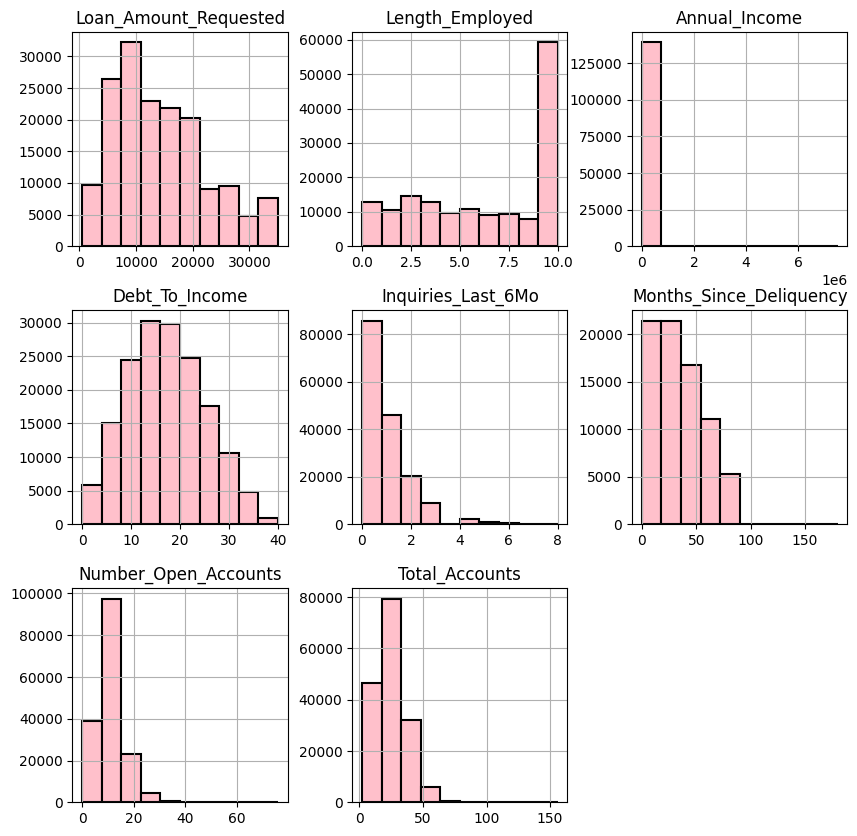

In [ ]:
# Plot histogram of numerical features
df.hist(column=num_features, figsize=(10, 10),
        edgecolor='black', color='pink', linewidth=1.5)

Bar plot

Categorical features

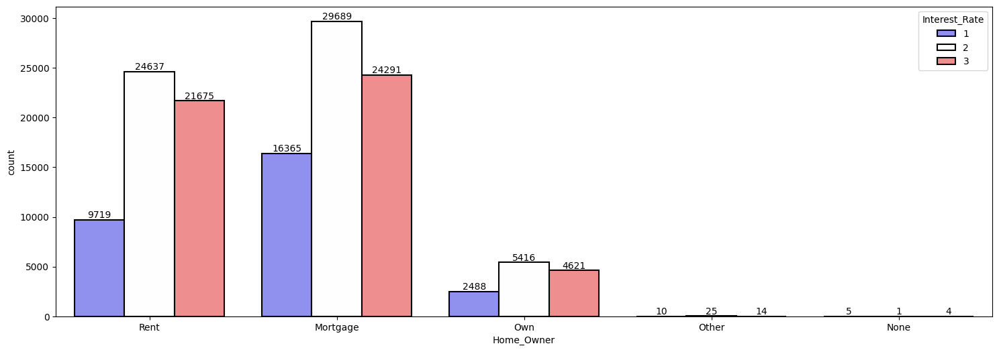

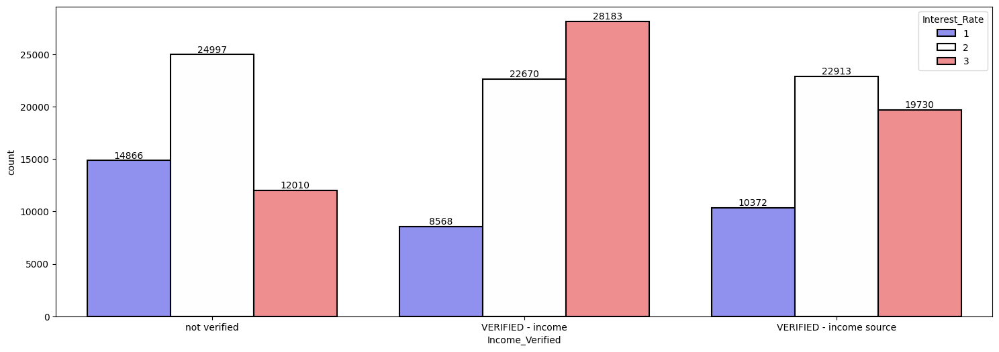

In [ ]:
for i, cat_feature in enumerate(cat_features):
    plt.figure(figsize=(18,6))
    ax=sns.countplot(x=cat_feature, data=df, palette="bwr",
                   hue='Interest_Rate', linewidth=1.5, edgecolor='black')
    for label in ax.containers:
        ax.bar_label(label)

Counting label values

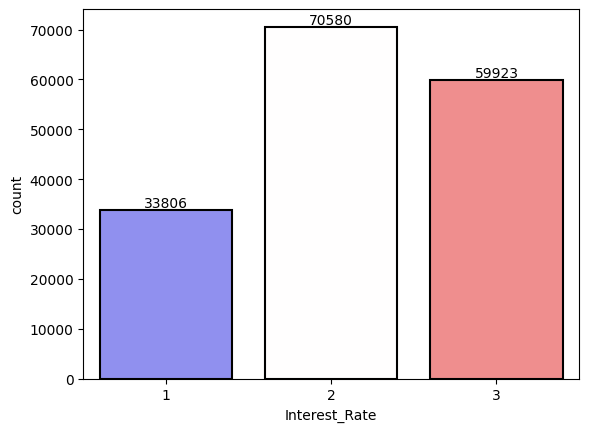

In [ ]:
ax = sns.countplot(x="Interest_Rate", data=df, palette="bwr",
                   linewidth=1.5, edgecolor='black')
for label in ax.containers:
    ax.bar_label(label)

plt.show()

Box plot

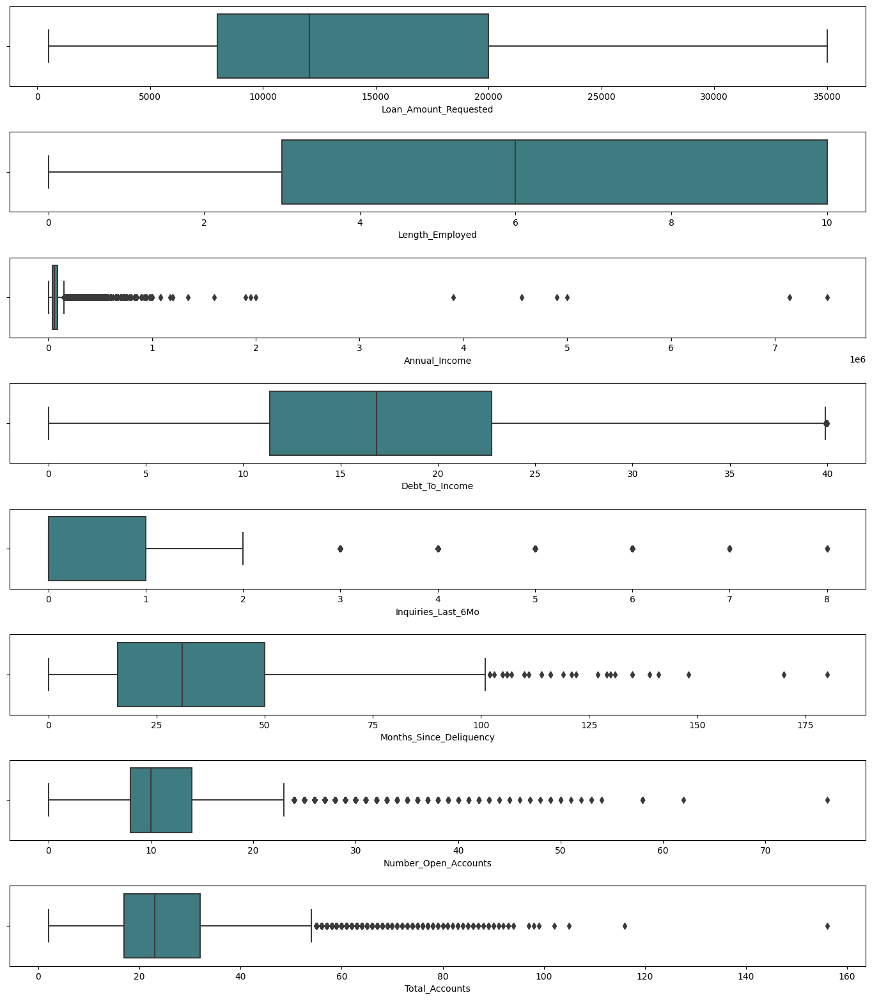

In [ ]:
box_cols = num_features
fig, axes=plt.subplots(len(box_cols), 1, figsize=(14, 2*len(box_cols)),sharex=False,sharey=False)

for i, column in enumerate(box_cols):
    sns.boxplot(x=column,data=df,palette='crest',ax=axes[i])
plt.tight_layout(pad=2.0)

Histogram plot

In [ ]:
df.select_dtypes(include=np.number)

,Loan_Amount_Requested,Length_Employed,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
0,7000,0,68000.0,18.37,0,NaN,9,14,1
1,30000,4,NaN,14.93,0,17.0,12,24,3
2,24725,7,75566.4,15.88,0,NaN,12,16,3
3,16000,0,56160.0,14.34,3,NaN,16,22,3
4,17000,8,96000.0,22.17,1,NaN,19,30,1
...,...,...,...,...,...,...,...,...,...
164304,20725,10,NaN,13.56,0,NaN,13,16,2
164305,6000,8,NaN,9.12,0,36.0,13,30,2
164306,20250,10,NaN,18.17,1,NaN,17,30,1
164307,10000,4,NaN,18.75,1,48.0,16,62,3


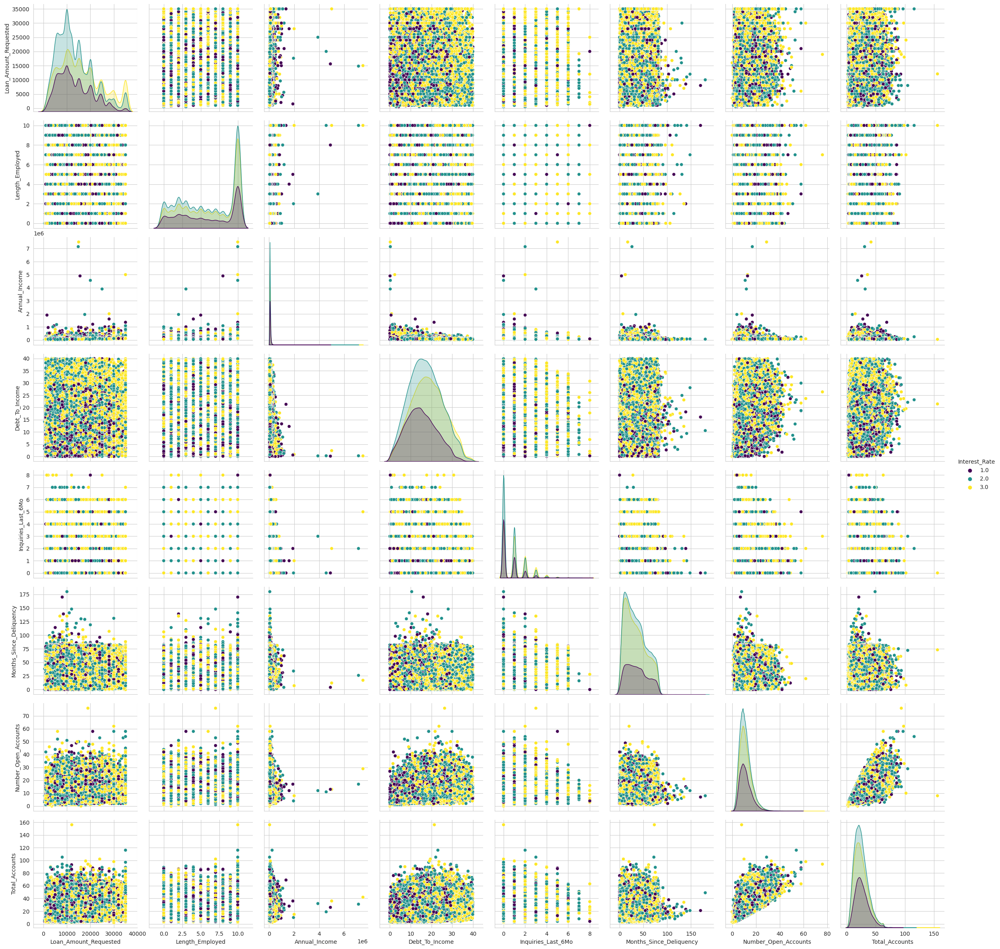

In [ ]:
sns.set_style('whitegrid')
sns.pairplot(df.select_dtypes(include=np.number).astype(float),
             hue = 'Interest_Rate', height = 3,
             palette = 'viridis')
plt.show()

# Feature Engineering + Applying Model

In [ ]:
def prepare_X_y(df):
    """
    Feature engineering and create X and y
    :param df: pandas dataframe
    :return: (X, y) output feature matrix (dataframe), target (series)
    """
    # Todo: Split data into X and y (using sklearn train_test_split). Return two dataframes
    X =  df[df.columns[:-1]]
    y =  df[df.columns[-1]]
    return X, y


X, y = prepare_X_y(df)


In [ ]:
from sklearn.model_selection import train_test_split
RANDOM_STATE = 20
TRAIN_SIZE = 0.75
trainX, testX ,trainY, testY = train_test_split(X, y, train_size=TRAIN_SIZE, random_state=RANDOM_STATE,stratify=y)

In [ ]:
from sklearn.model_selection import GridSearchCV
def build_model(X, y,pipeline, param_grid):

    # Tạo GridSearchCV
    grid_search = TuneGridSearchCV(
        pipeline,  # Mô hình được sử dụng
        param_grid,  # Các tham số cần tìm kiếm
        cv=5,  # Số lượng fold trong cross-validation
        scoring='f1_weighted',  # Độ đo sử dụng để đánh giá mô hình
        n_jobs = -1, # Sử dụng tài nguyên chưa sử dụng để train model
        return_train_score=True, # Trả về score trong quá trình training với tham số dược fine-tuning
    )

    register_ray()
    with parallel_backend("ray"):
      grid_search.fit(X, y)
    return grid_search


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_extraction import FeatureHasher
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier

numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy='mean')), ("scaler", StandardScaler())]
)
categorical_transformer = Pipeline(
    steps=[
        ("imputer",SimpleImputer(strategy='most_frequent')),
        ("encoder", OneHotEncoder(handle_unknown="infrequent_if_exist"))
    ]
)
hashing_transformer =Pipeline(
    steps=[
        ("inputer",SimpleImputer(strategy='most_frequent')),
        ("encoder",FeatureHasher(n_features=5,input_type='string'))
    ]
)
# Tạo đối tượng preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ("num",numeric_transformer,num_features),
        ("cat", categorical_transformer, cat_features),
        ("hashing",hashing_transformer,hashing_feature)
    ]
)
# estimator=MLPClassifier()
estimator=RandomForestClassifier()
# Tạo Pipeline
pipeline = Pipeline(steps=[
    ('column_transformer', preprocessor),
    # ('pca',PCA(n_components='mle')),
    ('estimator', estimator)
])

param_grid={
    # "estimator__hidden_layer_sizes":[(50,),(100,),(200,)]
    # "estimator__hidden_layer_sizes":[(100,)]
    "estimator__n_estimators":[20,50,100]
}

In [ ]:
from sklearn.metrics import classification_report
model = build_model(trainX, trainY,pipeline,param_grid)
# Compare on training dataset
pred = model.predict(trainX)
print('Train : \n')
print(classification_report(trainY,pred))
pred = model.predict(testX)
print('Test : \n')
print(classification_report(testY,pred))
print(f'Best parameter : {model.best_params_}')

/usr/local/lib/python3.10/dist-packages/ray/tune/tune.py:258: UserWarning: Passing a `local_dir` is deprecated and will be removed in the future. Pass `storage_path` instead or set the`RAY_AIR_LOCAL_CACHE_DIR` environment variable instead.
  warnings.warn(


Train : 

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     25354
           2       1.00      1.00      1.00     52935
           3       1.00      1.00      1.00     44942

    accuracy                           1.00    123231
   macro avg       1.00      1.00      1.00    123231
weighted avg       1.00      1.00      1.00    123231

Test : 

              precision    recall  f1-score   support

           1       0.46      0.25      0.33      8452
           2       0.49      0.60      0.54     17645
           3       0.56      0.55      0.55     14981

    accuracy                           0.51     41078
   macro avg       0.50      0.47      0.47     41078
weighted avg       0.51      0.51      0.50     41078

Best parameter : {'estimator__n_estimators': 100}


In [ ]:
estimator=MLPClassifier()
# Tạo Pipeline
pipeline = Pipeline(steps=[
    ('column_transformer', preprocessor),
    # ('pca',PCA(n_components='mle')),
    ('estimator', estimator)
])

param_grid={
    "estimator__hidden_layer_sizes":[(200,),(500,)]
    # "estimator__hidden_layer_sizes":[(100,)]
}

from sklearn.metrics import classification_report
model = build_model(trainX, trainY,pipeline,param_grid)
# Compare on training dataset
pred = model.predict(trainX)
print('Train : \n')
print(classification_report(trainY,pred))
pred = model.predict(testX)
print('Test : \n')
print(classification_report(testY,pred))
print(f'Best parameter : {model.best_params_}')

/usr/local/lib/python3.10/dist-packages/ray/tune/tune.py:258: UserWarning: Passing a `local_dir` is deprecated and will be removed in the future. Pass `storage_path` instead or set the`RAY_AIR_LOCAL_CACHE_DIR` environment variable instead.
  warnings.warn(
(_Trainable pid=13378) /usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
(_Trainable pid=13378)   warnings.warn(
2023-07-03 01:25:20,312	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'estimator__hidden_layer_sizes': (200,)}
(_Trainable pid=13378) /usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
(_Trainable pid=13378)   warnings.warn(
(_Trainable pid=13378) /us

Train : 

              precision    recall  f1-score   support

           1       0.56      0.32      0.41     25354
           2       0.53      0.63      0.57     52935
           3       0.60      0.61      0.61     44942

    accuracy                           0.56    123231
   macro avg       0.56      0.52      0.53    123231
weighted avg       0.56      0.56      0.55    123231

Test : 

              precision    recall  f1-score   support

           1       0.49      0.28      0.36      8452
           2       0.50      0.60      0.54     17645
           3       0.57      0.57      0.57     14981

    accuracy                           0.52     41078
   macro avg       0.52      0.48      0.49     41078
weighted avg       0.52      0.52      0.51     41078

Best parameter : {'estimator__hidden_layer_sizes': (200,)}


In [ ]:
from sklearn.svm import SVC
estimator=SVC()
# Tạo Pipeline
pipeline = Pipeline(steps=[
    ('column_transformer', preprocessor),
    # ('pca',PCA(n_components='mle')),
    ('estimator', estimator)
])

param_grid={
    # "estimator__hidden_layer_sizes":[(50,),(100,),(200,)]
    # "estimator__hidden_layer_sizes":[(100,)]
    "estimator__kernel":['rbf']
}

from sklearn.metrics import classification_report
model = build_model(trainX, trainY,pipeline,param_grid)
# Compare on training dataset
pred = model.predict(trainX)
print('Train : \n')
print(classification_report(trainY,pred))
pred = model.predict(testX)
print('Test : \n')
print(classification_report(testY,pred))
print(f'Best parameter : {model.best_params_}')

/usr/local/lib/python3.10/dist-packages/ray/tune/tune.py:258: UserWarning: Passing a `local_dir` is deprecated and will be removed in the future. Pass `storage_path` instead or set the`RAY_AIR_LOCAL_CACHE_DIR` environment variable instead.
  warnings.warn(
2023-07-03 02:16:51,135	WARNING tune.py:192 -- Stop signal received (e.g. via SIGINT/Ctrl+C), ending Ray Tune run. This will try to checkpoint the experiment state one last time. Press CTRL+C (or send SIGINT/SIGKILL/SIGTERM) to skip. 


KeyboardInterrupt: ignored

## Tensorflow framework

In [ ]:
!pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 10.3 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from keras.wrappers.scikit_learn import KerasClassifier
import tensorflow_addons as tfa
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.12.0


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Build model neuron network

In [ ]:
import tensorflow as tf
from keras.wrappers.scikit_learn import KerasClassifier
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.12.0


In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:


def create_nn ():
  model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    # tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
  ])


  lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-2,
        decay_steps=100, #100
        decay_rate=0.9 # 0.9
  )

  model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    loss='sparse_categorical_crossentropy',
    metrics= ['accuracy']
  )

  return model

# Create early stopping callback
#   when f1 score doesn't improve for 5 epochs
callbacks = [tf.keras.callbacks.EarlyStopping(
                monitor = 'val_accuracy',
                patience=3
              ),
            tf.keras.callbacks.ModelCheckpoint(
                  '/content/MachineLearningBasic/Final Project/model',
                  save_best_only=True,
                  mode='auto', period=1
            ),
            tf.keras.callbacks.TensorBoard(log_dir='./logs')]

estimator = KerasClassifier(build_fn=create_nn,
                            epochs=100,
                            batch_size=256,
                            callbacks=callbacks,
                            verbose=1)

# Pipeline for numerical and categorical features
numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy='mean')), ("scaler", StandardScaler())]
)
categorical_transformer = Pipeline(
    steps=[
        ("imputer",SimpleImputer(strategy='most_frequent')),
        ("encoder", OneHotEncoder(handle_unknown="infrequent_if_exist"))
    ]
)
hashing_transformer =Pipeline(
    steps=[
        ("inputer",SimpleImputer(strategy='most_frequent')),
        ("encoder",FeatureHasher(n_features=5,input_type='string'))
    ]
)


# Tạo đối tượng preprocessor for each feature type
preprocessor = ColumnTransformer(
    transformers=[
        ("num",numeric_transformer,num_features),
        ("cat", categorical_transformer, cat_features),
        ("hashing",hashing_transformer,hashing_feature)
    ]
)

# Create Pipeline
pipeline = Pipeline(steps=[
    ('column_transformer', preprocessor),
    ('estimator', estimator)
])

history = pipeline.fit(trainX, trainY)

<ipython-input-84-ec2522ca239b>:40: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  estimator = KerasClassifier(build_fn=create_nn,


Epoch 1/100
476/482 [============================>.] - ETA: 0s - loss: 0.9598 - accuracy: 0.5116

482/482 [==============================] - 2s 3ms/step - loss: 0.9596 - accuracy: 0.5118
Epoch 2/100
479/482 [============================>.] - ETA: 0s - loss: 0.9459 - accuracy: 0.5234

482/482 [==============================] - 2s 3ms/step - loss: 0.9458 - accuracy: 0.5234
Epoch 3/100
476/482 [============================>.] - ETA: 0s - loss: 0.9398 - accuracy: 0.5271

482/482 [==============================] - 2s 4ms/step - loss: 0.9400 - accuracy: 0.5271
Epoch 4/100
482/482 [==============================] - ETA: 0s - loss: 0.9357 - accuracy: 0.5291

482/482 [==============================] - 2s 4ms/step - loss: 0.9357 - accuracy: 0.5291
Epoch 5/100
465/482 [===========================>..] - ETA: 0s - loss: 0.9328 - accuracy: 0.5321

482/482 [==============================] - 2s 4ms/step - loss: 0.9331 - accuracy: 0.5320
Epoch 6/100
478/482 [============================>.] - ETA: 0s - loss: 0.9312 - accuracy: 0.5336

482/482 [==============================] - 1s 2ms/step - loss: 0.9312 - accuracy: 0.5336
Epoch 7/100
481/482 [============================>.] - ETA: 0s - loss: 0.9300 - accuracy: 0.5343

482/482 [==============================] - 1s 2ms/step - loss: 0.9300 - accuracy: 0.5343
Epoch 8/100
479/482 [============================>.] - ETA: 0s - loss: 0.9292 - accuracy: 0.5348

482/482 [==============================] - 1s 2ms/step - loss: 0.9291 - accuracy: 0.5348
Epoch 9/100
464/482 [===========================>..] - ETA: 0s - loss: 0.9290 - accuracy: 0.5350

482/482 [==============================] - 1s 2ms/step - loss: 0.9286 - accuracy: 0.5353
Epoch 10/100
469/482 [============================>.] - ETA: 0s - loss: 0.9286 - accuracy: 0.5354

482/482 [==============================] - 1s 3ms/step - loss: 0.9283 - accuracy: 0.5356
Epoch 11/100
471/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5355

482/482 [==============================] - 1s 3ms/step - loss: 0.9281 - accuracy: 0.5356
Epoch 12/100
465/482 [===========================>..] - ETA: 0s - loss: 0.9277 - accuracy: 0.5360

482/482 [==============================] - 1s 3ms/step - loss: 0.9280 - accuracy: 0.5356
Epoch 13/100
474/482 [============================>.] - ETA: 0s - loss: 0.9276 - accuracy: 0.5361

482/482 [==============================] - 1s 3ms/step - loss: 0.9279 - accuracy: 0.5357
Epoch 14/100
471/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5355

482/482 [==============================] - 2s 4ms/step - loss: 0.9279 - accuracy: 0.5357
Epoch 15/100
472/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5354

482/482 [==============================] - 2s 4ms/step - loss: 0.9279 - accuracy: 0.5358
Epoch 16/100
482/482 [==============================] - ETA: 0s - loss: 0.9278 - accuracy: 0.5359

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5359
Epoch 17/100
477/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5359

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 18/100
465/482 [===========================>..] - ETA: 0s - loss: 0.9281 - accuracy: 0.5355

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 19/100
463/482 [===========================>..] - ETA: 0s - loss: 0.9281 - accuracy: 0.5355

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 20/100
478/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5359

482/482 [==============================] - 1s 2ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 21/100
471/482 [============================>.] - ETA: 0s - loss: 0.9276 - accuracy: 0.5357

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 22/100
472/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5360

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 23/100
471/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5356

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 24/100
481/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5357

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 25/100
481/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 26/100
478/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5360

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 27/100
471/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5357

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 28/100
464/482 [===========================>..] - ETA: 0s - loss: 0.9284 - accuracy: 0.5354

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 29/100
473/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5359

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 30/100
473/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5356

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 31/100
482/482 [==============================] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 1s 2ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 32/100
480/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5360

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 33/100
474/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5360

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 34/100
468/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5361

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 35/100
474/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5359

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 36/100
478/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5359

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 37/100
472/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5358

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 38/100
481/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 39/100
465/482 [===========================>..] - ETA: 0s - loss: 0.9281 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 40/100
469/482 [============================>.] - ETA: 0s - loss: 0.9275 - accuracy: 0.5362

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 41/100
473/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5357

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 42/100
465/482 [===========================>..] - ETA: 0s - loss: 0.9281 - accuracy: 0.5355

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 43/100
480/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 44/100
467/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5357

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 45/100
481/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 46/100
477/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5359

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 47/100
476/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5356

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 48/100
473/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5360

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 49/100
476/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5359

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 50/100
470/482 [============================>.] - ETA: 0s - loss: 0.9283 - accuracy: 0.5356

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 51/100
466/482 [============================>.] - ETA: 0s - loss: 0.9280 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 52/100
472/482 [============================>.] - ETA: 0s - loss: 0.9280 - accuracy: 0.5359

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 53/100
470/482 [============================>.] - ETA: 0s - loss: 0.9276 - accuracy: 0.5360

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 54/100
475/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5357

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 55/100
480/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 56/100
471/482 [============================>.] - ETA: 0s - loss: 0.9282 - accuracy: 0.5353

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 57/100
481/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5359

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 58/100
481/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5359

482/482 [==============================] - 2s 5ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 59/100
478/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5359

482/482 [==============================] - 3s 5ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 60/100
469/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5361

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 61/100
474/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5360

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 62/100
474/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5357

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 63/100
477/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5361

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 64/100
472/482 [============================>.] - ETA: 0s - loss: 0.9280 - accuracy: 0.5357

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 65/100
473/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5357

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 66/100
482/482 [==============================] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 67/100
482/482 [==============================] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 5ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 68/100
482/482 [==============================] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 5ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 69/100
470/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5359

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 70/100
474/482 [============================>.] - ETA: 0s - loss: 0.9280 - accuracy: 0.5358

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 71/100
474/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5358

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 72/100
481/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 73/100
470/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5355

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 74/100
465/482 [===========================>..] - ETA: 0s - loss: 0.9283 - accuracy: 0.5353

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 75/100
471/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5354

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 76/100
474/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5359

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 77/100
474/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5358

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 78/100
473/482 [============================>.] - ETA: 0s - loss: 0.9280 - accuracy: 0.5356

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 79/100
468/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5354

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 80/100
481/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 81/100
481/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5359

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 82/100
482/482 [==============================] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 83/100
470/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5356

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 84/100
472/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 85/100
467/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 86/100
464/482 [===========================>..] - ETA: 0s - loss: 0.9274 - accuracy: 0.5361

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 87/100
474/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5359

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 88/100
472/482 [============================>.] - ETA: 0s - loss: 0.9275 - accuracy: 0.5359

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 89/100
480/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5358

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 90/100
481/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5358

482/482 [==============================] - 2s 5ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 91/100
476/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5356

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 92/100
472/482 [============================>.] - ETA: 0s - loss: 0.9272 - accuracy: 0.5361

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 93/100
478/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5355

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 94/100
469/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5359

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 95/100
480/482 [============================>.] - ETA: 0s - loss: 0.9277 - accuracy: 0.5358

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 96/100
467/482 [============================>.] - ETA: 0s - loss: 0.9281 - accuracy: 0.5356

482/482 [==============================] - 1s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 97/100
476/482 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.5359

482/482 [==============================] - 2s 3ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 98/100
481/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 5ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 99/100
480/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5359

482/482 [==============================] - 2s 5ms/step - loss: 0.9278 - accuracy: 0.5358
Epoch 100/100
480/482 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.5358

482/482 [==============================] - 2s 4ms/step - loss: 0.9278 - accuracy: 0.5358


In [ ]:
y_pred = pipeline.predict(testX)
f1_score(testY, y_pred, average='weighted')

1284/1284 [==============================] - 2s 1ms/step


0.5180303773856353

In [ ]:
%tensorboard --logdir logs/train

<IPython.core.display.Javascript object>